# VICReg Model Analysis for TUFFC
- Sanity checks to test for spurious correlations

## Set up environment and load model checkpoint

In [1]:
import sys 
sys.path.append('../')

In [2]:
# open the vicreg checkpoint 
import json
with open('../.named_checkpoints.json', 'r') as f:
    named_checkpoints = json.load(f)
vicreg_checkpoint = named_checkpoints['vicreg_uva_pretrain']
import torch 
sd = torch.load(vicreg_checkpoint)

/home/paulw/anaconda3/envs/exact/lib/python3.9/site-packages/pl_bolts/utils/warnings.py:30: UserWarning: You want to use `gym` which is not installed yet, install it with `pip install gym`.
  stdout_func(


In [3]:
# load the parameters to the vicreg model
sd = torch.load(vicreg_checkpoint)
from src.lightning.lightning_modules.self_supervised.vicreg import VICReg
vicreg = VICReg.load_from_checkpoint(vicreg_checkpoint)

# because the model was actually copied in the callback, we need to get the weights from the callback

In [4]:
vicreg.backbone.load_state_dict(sd['callbacks']["OnlineEvaluation{'prefix': 'online_finetune_train_uva'}"]["model"]['backbone']) 
vicreg.linear_layer.load_state_dict(sd['callbacks']["OnlineEvaluation{'prefix': 'online_finetune_train_uva'}"]["model"]['linear_layer']) 

<All keys matched successfully>

## Performance Stress Testing

First, we will stress test the model using ideas from [Mahmood et Al., 2021](https://www.frontiersin.org/articles/10.3389/fdgth.2021.671015/full) to detect spurious corellations.

In [5]:
# splits and transforms are fixed for the model.
from src.data.exact.splits import Splits, HasProstateMaskFilter, InvolvementThresholdFilter
splits = Splits(
    train_val_split_seed=3, 
    undersample_benign_eval=True,
    merge_test_centers=True, 
    merge_val_centers=True
)

# create the transforms. it should use the no augs transform
from src.data.exact.transforms import TransformV3
transform = TransformV3()

First, we simply reproduce the test performance of the model, I.E on patches from needle region for all cores in the test set.

In [6]:
# create the datamodule
from src.data.exact.dataset.patches_dataset_seperate_regions import RFPatchesDataModule, PatchSelectionOptions
dm = RFPatchesDataModule(
    splits=splits,
    train_transform=transform,
    eval_transform=transform,
    ssl_mode=False, 

    patch_selection_options=PatchSelectionOptions(
        discard_inside_prostate=1, 
        discard_outside_prostate=1,
    )
)
dm.setup()
test_loader = dm.test_dataloader()

selecting patches:   0%|          | 0/344 [00:00<?, ?it/s]

selecting patches:   0%|          | 0/49 [00:00<?, ?it/s]

selecting patches:   0%|          | 0/81 [00:00<?, ?it/s]

In [7]:
patch, pos, label, metadata = next(iter(test_loader))

In [8]:
def test_model(test_loader):
    from tqdm.auto import tqdm

    vicreg.eval().to('cuda:1')

    from src.utils.metrics import PatchwiseAndCorewiseMetrics
    metrics_fn = PatchwiseAndCorewiseMetrics(
        compute_corewise_and_patchwise=True, 
        breakdown_by_center=False, 
        metrics=['auroc', 'acc_macro', 'positive_guess_ratio']
    )

    from src.utils.metrics import OutputCollector
    output_collector = OutputCollector()

    for patch, pos, label, metadata in tqdm(test_loader):
        with torch.inference_mode():
            feats = vicreg.get_features(patch.to('cuda:1'))
            logits = vicreg.linear_layer(feats)
        output_collector.collect_batch({'logits':logits, 'labels': label, 
        'position': pos, 
        **metadata})

    out = output_collector.compute()
    output_collector.reset()
    return metrics_fn(out), out
    #return output_collector, 

test_model(test_loader)[0]

  0%|          | 0/34 [00:00<?, ?it/s]

{'patch_auroc': tensor(0.8195),
 'patch_macro_acc': tensor(0.7192),
 'patch_positive_guess_ratio': tensor(0.4422),
 'core_auroc': tensor(0.9226),
 'core_macro_acc': tensor(0.8232),
 'core_positive_guess_ratio': tensor(0.4465)}

We have successfully reproduced the results found in the original experiment. The needle region is correcly classified with a __patch-wise AUROC of around 85%__. 

Now, let's look at how well the prostate region excluding the needle region is classified. It should not be classified well, because the labels do not actually apply to this region. However, it is likely to be better than random guessing, because prostates whose needle region was positive for cancer should also have prostate region positive for cancer more often. 

In [9]:
# create the datamodule
from src.data.exact.dataset.patches_dataset_seperate_regions import RFPatchesDataModule, PatchSelectionOptions
dm = RFPatchesDataModule(
    splits=splits,
    train_transform=transform,
    eval_transform=transform,
    ssl_mode=False, 

    patch_selection_options=PatchSelectionOptions(
        needle_region_overlap_threshold=0.1,
        discard_inside_needle=1,
        discard_inside_prostate=0, 
        discard_outside_prostate=1,
    )
)
dm.setup()
test_loader = dm.test_dataloader()

test_model(test_loader)[0]

selecting patches:   0%|          | 0/344 [00:00<?, ?it/s]

selecting patches:   0%|          | 0/49 [00:00<?, ?it/s]

selecting patches:   0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/298 [00:00<?, ?it/s]

{'patch_auroc': tensor(0.7377),
 'patch_macro_acc': tensor(0.6740),
 'patch_positive_guess_ratio': tensor(0.4483),
 'core_auroc': tensor(0.9110),
 'core_macro_acc': tensor(0.7965),
 'core_positive_guess_ratio': tensor(0.4421)}

This is concerning. We checked for bugs as well, and could not find any. It appears that the model still correctly classified patches inside the prostate but outside the needle to the same label as the needle region.

The real test is whether it can correctly classify patches that are outside of the prostate. If it can, then it is definitely picking up spurious features. 

In [10]:
dm = RFPatchesDataModule(
    splits=splits,
    train_transform=transform,
    eval_transform=transform,
    ssl_mode=False, 

    patch_selection_options=PatchSelectionOptions(
        needle_region_overlap_threshold=0.01,
        prostate_region_overlap_threshold=.01,
        discard_inside_needle=1,
        discard_inside_prostate=1, 
        discard_outside_prostate=0,
    )
)
dm.setup()
test_loader = dm.test_dataloader()

test_model(test_loader)[0]

selecting patches:   0%|          | 0/344 [00:00<?, ?it/s]

selecting patches:   0%|          | 0/49 [00:00<?, ?it/s]

selecting patches:   0%|          | 0/81 [00:00<?, ?it/s]

  0%|          | 0/427 [00:00<?, ?it/s]

{'patch_auroc': tensor(0.5325),
 'patch_macro_acc': tensor(0.5120),
 'patch_positive_guess_ratio': tensor(0.4398),
 'core_auroc': tensor(0.6058),
 'core_macro_acc': tensor(0.4723),
 'core_positive_guess_ratio': tensor(0.4393)}

This is good news. This tells us that the model cannot look at a patch outside the prostate and correctly classify it to have the same needle region. If it could, this would certainly be an indication that something other than tissue type is being used to predict cancer.

In [11]:
# this line of code lists the intersections in the two masks for each patch, as a sanity check: 
ds = test_loader.dataset
[ ds._patch_views[i][j][2] for i, j in ds.idx_to_patch_and_core_idx]

[{'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.16424923391215526, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'needle': 0.0, 'prostate': 0.0},
 {'n

## More Detailed Analysis

Let's take a closer look. Let's look at all the patches (we can access the different needle and mask thresholds from the batch)

In [12]:
# create the datamodule
from src.data.exact.dataset.patches_dataset_seperate_regions import RFPatchesDataModule, PatchSelectionOptions
dm = RFPatchesDataModule(
    splits=splits,
    train_transform=transform,
    eval_transform=transform,
    ssl_mode=False, 

    patch_selection_options=PatchSelectionOptions(
        needle_region_overlap_threshold=0.1,
        discard_inside_needle=None,
        discard_inside_prostate=None, 
        discard_outside_prostate=None,
    ), 
)
dm.setup()
test_loader = dm.test_dataloader()

sample_batch = next(iter(test_loader))
additional_info = sample_batch[3]
additional_info.keys()

selecting patches:   0%|          | 0/344 [00:00<?, ?it/s]

selecting patches:   0%|          | 0/49 [00:00<?, ?it/s]

selecting patches:   0%|          | 0/81 [00:00<?, ?it/s]

dict_keys(['patient_id', 'path_on_server', 'center', 'loc', 'grade', 'age', 'family_history', 'psa', 'pct_cancer', 'primary_grade', 'secondary_grade', 'patient_specifier', 'core_specifier', 'needle_overlap', 'prostate_overlap'])

In [13]:
_, out = test_model(test_loader)

  0%|          | 0/1276 [00:00<?, ?it/s]

Add a column for the loss

In [14]:
out['ce_loss'] = torch.nn.functional.cross_entropy(out['logits'], out['labels'], reduction='none')

In [15]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt

predictions_dataframe = [] 
for i in range(len(out['logits'])): 
    row = {
        'cancer_score': out['preds'][i][1].item(),
        'core_specifier': out['core_specifier'][i],
        'patient_specifier': out['patient_specifier'][i],
        'grade': out['grade'][i],
        'ce_loss': out['ce_loss'][i].item(),
        'needle_overlap': out['needle_overlap'][i].item(),
        'prostate_overlap': out['prostate_overlap'][i].item(),
        'age': out['age'][i].item(),
        'center': out['center'][i],
        'psa': out['psa'][i].item(),
        'position_axial': ((out['position'][i][0] + out['position'][i][1])/2).item(),
        'position_lateral': ((out['position'][i][2] + out['position'][i][3])/2).item(),
        'correct': ((out['grade'][i] != "Benign") == (out['preds'][i][1] > 0.5)).item(),        
        'anatomical_location': out['loc'][i],
        'top_height_left_width': out['position'][i].numpy()
    }
    predictions_dataframe.append(row)
predictions_dataframe = pd.DataFrame(predictions_dataframe)

Add a column for "All cores for the patient are benign"

In [16]:
# add a column for "all cores for patient are benign"
from src.data.exact.resources import metadata
from functools import cache
table = metadata()
@cache
def all_cores_benign(patient_specifier):
    return (table.query('patient_specifier == @patient_specifier')['grade'] == 'Benign').all()
predictions_dataframe['all_cores_benign'] = predictions_dataframe['patient_specifier'].apply(all_cores_benign)

Let's look at the accuracy for the different regions:

In [17]:
outside_prostate = predictions_dataframe[predictions_dataframe['prostate_overlap'] == 0.00]
from sklearn.metrics import roc_auc_score, accuracy_score, balanced_accuracy_score
print(roc_auc_score(outside_prostate['grade'] != 'Benign', outside_prostate['cancer_score'],))
print(accuracy_score(outside_prostate['grade'] != 'Benign', outside_prostate['cancer_score'] > 0.5))
print(balanced_accuracy_score(outside_prostate['grade'] != 'Benign', outside_prostate['cancer_score'] > 0.5))

0.5573620161799288
0.55684421534937
0.5345409274821039


In [18]:
inside_needle_and_prostate = predictions_dataframe[(predictions_dataframe['needle_overlap'] > 0.70) & (predictions_dataframe['prostate_overlap'] > .99)]
from sklearn.metrics import roc_auc_score
print(roc_auc_score(inside_needle_and_prostate['grade'] != 'Benign', inside_needle_and_prostate['cancer_score'],))
print(accuracy_score(inside_needle_and_prostate['grade'] != 'Benign', inside_needle_and_prostate['cancer_score'] > 0.5, ))
print(balanced_accuracy_score(inside_needle_and_prostate['grade'] != 'Benign', inside_needle_and_prostate['cancer_score'] > 0.5, ))

0.8543728789592762
0.8045212765957447
0.7683823529411764


In [19]:
inside_prostate_but_not_needle = predictions_dataframe[(predictions_dataframe['needle_overlap'] < 0.01) & (predictions_dataframe['prostate_overlap'] > .99)]
print(roc_auc_score(inside_prostate_but_not_needle['grade'] != 'Benign', inside_prostate_but_not_needle['cancer_score'],))
print(accuracy_score(inside_prostate_but_not_needle['grade'] != 'Benign', inside_prostate_but_not_needle['cancer_score'] > 0.5, ))
print(balanced_accuracy_score(inside_prostate_but_not_needle['grade'] != 'Benign', inside_prostate_but_not_needle['cancer_score'] > 0.5, ))

0.7467460373441658
0.6834582942830365
0.6794367684758886


In [20]:
predictions_dataframe.query('grade == "Benign"')

,cancer_score,core_specifier,patient_specifier,grade,ce_loss,needle_overlap,prostate_overlap,age,center,psa,position_axial,position_lateral,correct,anatomical_location,top_height_left_width,all_cores_benign
0,0.560625,UVA-0036_LML,UVA-0036,Benign,0.822402,0.636772,1.000000,72,UVA,5.26,12.5,32.5,False,LML,"[10, 15, 30, 35]",False
1,0.594042,UVA-0036_LML,UVA-0036,Benign,0.901505,0.636772,1.000000,72,UVA,5.26,12.5,33.5,False,LML,"[10, 15, 31, 36]",False
2,0.632899,UVA-0036_LML,UVA-0036,Benign,1.002117,0.636772,1.000000,72,UVA,5.26,12.5,34.5,False,LML,"[10, 15, 32, 37]",False
3,0.602810,UVA-0036_LML,UVA-0036,Benign,0.923340,0.636772,1.000000,72,UVA,5.26,12.5,35.5,False,LML,"[10, 15, 33, 38]",False
4,0.641652,UVA-0036_LML,UVA-0036,Benign,1.026251,0.636772,1.000000,72,UVA,5.26,12.5,36.5,False,LML,"[10, 15, 34, 39]",False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50395,0.486606,UVA-0410_RBM,UVA-0410,Benign,0.666711,0.000000,0.191788,56,UVA,2.98,25.5,39.5,True,RBM,"[23, 28, 37, 42]",True
50396,0.505011,UVA-0410_RBM,UVA-0410,Benign,0.703219,0.000000,0.191788,56,UVA,2.98,25.5,40.5,False,RBM,"[23, 28, 38, 43]",True
50397,0.498515,UVA-0410_RBM,UVA-0410,Benign,0.690182,0.000000,0.191788,56,UVA,2.98,25.5,41.5,True,RBM,"[23, 28, 39, 44]",True
50398,0.492304,UVA-0410_RBM,UVA-0410,Benign,0.677873,0.000000,0.191788,56,UVA,2.98,25.5,42.5,True,RBM,"[23, 28, 40, 45]",True


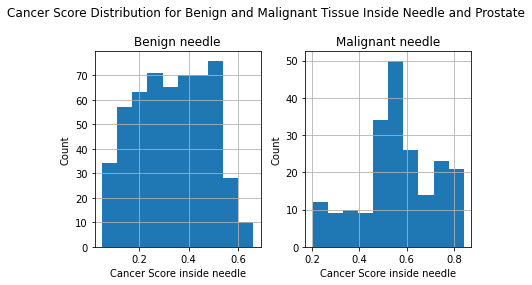

In [21]:
fig, ax = plt.subplots(1, 2)

inside_needle_and_prostate.query('grade == "Benign"')['cancer_score'].hist(ax=ax[0])
ax[0].set_title('Benign needle')
ax[0].set_xlabel('Cancer Score inside needle')
ax[0].set_ylabel('Count')
inside_needle_and_prostate.query('grade != "Benign"')['cancer_score'].hist(ax=ax[1])
ax[1].set_title('Malignant needle')
ax[1].set_xlabel('Cancer Score inside needle')
ax[1].set_ylabel('Count')

fig.suptitle('Cancer Score Distribution for Benign and Malignant Tissue Inside Needle and Prostate')
fig.tight_layout()


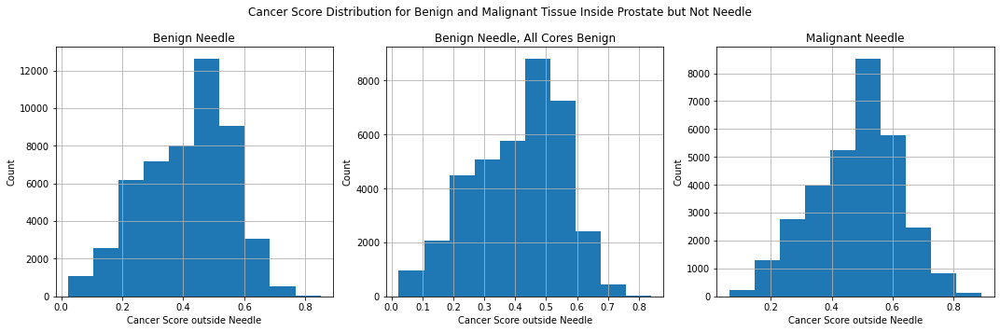

In [22]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

predictions_dataframe.query('grade == "Benign"')['cancer_score'].hist(ax=ax[0])
ax[0].set_title('Benign Needle')
ax[0].set_xlabel('Cancer Score outside Needle')
ax[0].set_ylabel('Count')

predictions_dataframe.query('grade == "Benign" & all_cores_benign')['cancer_score'].hist(ax=ax[1])
ax[1].set_title('Benign Needle, All Cores Benign')
ax[1].set_xlabel('Cancer Score outside Needle')
ax[1].set_ylabel('Count')

predictions_dataframe.query('grade != "Benign"')['cancer_score'].hist(ax=ax[2])
ax[2].set_title('Malignant Needle')
ax[2].set_xlabel('Cancer Score outside Needle')
ax[2].set_ylabel('Count')

fig.suptitle('Cancer Score Distribution for Benign and Malignant Tissue Inside Prostate but Not Needle')
fig.tight_layout()


<AxesSubplot:>

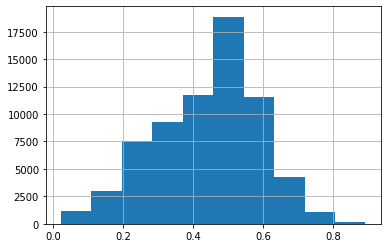

In [23]:
# Show the same excluding benign cores from patients without all cores benign

predictions_dataframe.query('grade != "Benign" or all_cores_benign == True')['cancer_score'].hist()


In [24]:
# fig, ax = plt.subplots(1, 2)
# 
# outside_prostate.query('grade == "Benign"')['cancer_score'].hist(ax=ax[0])
# ax[0].set_title('Benign')
# ax[0].set_xlabel('Cancer Score')
# ax[0].set_ylabel('Count')
# outside_prostate.query('grade != "Benign"')['cancer_score'].hist(ax=ax[1])
# ax[1].set_title('Malignant')
# ax[1].set_xlabel('Cancer Score')
# ax[1].set_ylabel('Count')
# 
# fig.suptitle('Cancer Score Distribution for Benign and Malignant Tissue Outside Prostate')
# fig.tight_layout()

Text(0.5, 0.98, 'Cancer Score Distribution for All Tissue')

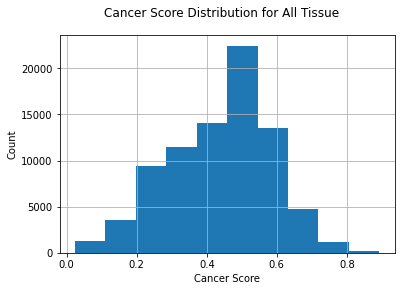

In [25]:
# Global score distribution
fig, ax = plt.subplots()

predictions_dataframe['cancer_score'].hist(ax=ax)
ax.set_xlabel('Cancer Score')
ax.set_ylabel('Count')

fig.suptitle('Cancer Score Distribution for All Tissue')

In [26]:
inside_needle_and_prostate.columns


Index(['cancer_score', 'core_specifier', 'patient_specifier', 'grade',
       'ce_loss', 'needle_overlap', 'prostate_overlap', 'age', 'center', 'psa',
       'position_axial', 'position_lateral', 'correct', 'anatomical_location',
       'top_height_left_width', 'all_cores_benign'],
      dtype='object')

## Accuracy and Cancer Probability by Position

Text(0.5, 1.0, 'Average cancer probability for Tissue Inside Needle and Prostate')

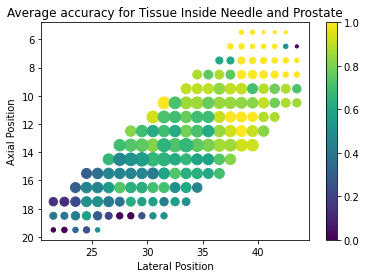

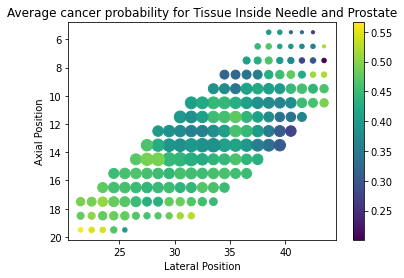

In [27]:
%matplotlib inline
inside_needle_and_prostate = predictions_dataframe.query("needle_overlap >= 0.66 and prostate_overlap >= 0.99")
test = inside_needle_and_prostate.groupby(['position_axial', 'position_lateral'])['correct'].mean().reset_index().sort_values('correct', ascending=False)
cancer_score = inside_needle_and_prostate.groupby(['position_axial', 'position_lateral'])['cancer_score'].mean().reset_index().sort_values('cancer_score', ascending=False)
# count of each position
counts = []
for (pos_axial, pos_lateral), row in inside_needle_and_prostate.groupby(['position_axial', 'position_lateral']):
    counts.append(
        {
            'position_axial': pos_axial,
            'position_lateral': pos_lateral,
            'count': len(row)
        }
    )

counts = pd.DataFrame(counts)
test = test.merge(counts, on=['position_axial', 'position_lateral'])
test = test.merge(cancer_score, on=['position_axial', 'position_lateral'])

plt.scatter(test['position_lateral'], test['position_axial'], c=test['correct'], s=test['count'] * 10, cmap='viridis')

# add a colorbar which maps values to colors.
plt.colorbar()
plt.gca().invert_yaxis()
plt.xlabel('Lateral Position')
plt.ylabel('Axial Position')
plt.title('Average accuracy for Tissue Inside Needle and Prostate')

plt.figure()
plt.scatter(test['position_lateral'], test['position_axial'], c=test['cancer_score'], s=test['count'] * 10, cmap='viridis')
plt.gca().invert_yaxis()
plt.colorbar()
plt.xlabel('Lateral Position')
plt.ylabel('Axial Position')
plt.title('Average cancer probability for Tissue Inside Needle and Prostate')

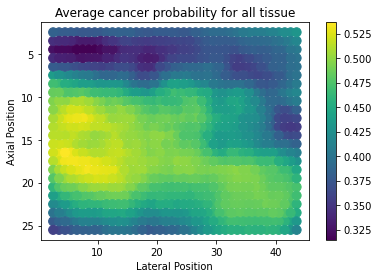

In [28]:
# Do the same for whole dataframe
test = predictions_dataframe.groupby(['position_axial', 'position_lateral'])['correct'].mean().reset_index().sort_values('correct', ascending=False)
cancer_score = predictions_dataframe.groupby(['position_axial', 'position_lateral'])['cancer_score'].mean().reset_index().sort_values('cancer_score', ascending=False)
counts = []
for (pos_axial, pos_lateral), row in predictions_dataframe.groupby(['position_axial', 'position_lateral']):
    counts.append(
        {
            'position_axial': pos_axial,
            'position_lateral': pos_lateral,
            'count': len(row)
        }
    )

counts = pd.DataFrame(counts)
test = test.merge(cancer_score, on=['position_axial', 'position_lateral'])
test = test.merge(counts, on=['position_axial', 'position_lateral'])

plt.scatter(test['position_lateral'], test['position_axial'], c=test['cancer_score'], s=test['count'] * 1, cmap='viridis',)
plt.gca().invert_yaxis()
plt.xlabel('Lateral Position')
plt.ylabel('Axial Position')
plt.title('Average cancer probability for all tissue')
plt.colorbar()

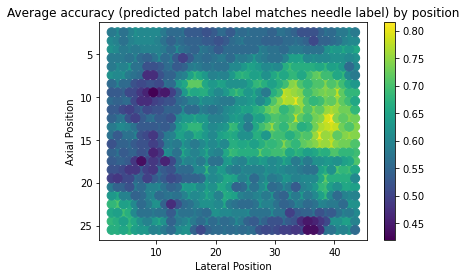

In [29]:
plt.scatter(test['position_lateral'], test['position_axial'], c=test['correct'], s=test['count'] * 1, cmap='viridis',)
plt.gca().invert_yaxis()
plt.xlabel('Lateral Position')
plt.ylabel('Axial Position')
plt.title('Average accuracy (predicted patch label matches needle label) by position')
plt.colorbar()

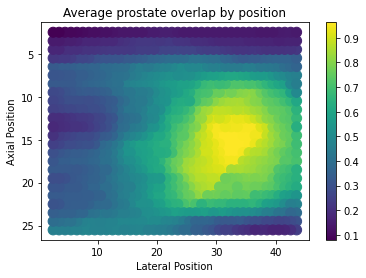

In [30]:
# control for average prostate position 
test = predictions_dataframe.groupby(['position_axial', 'position_lateral'])['prostate_overlap'].mean().reset_index().sort_values('prostate_overlap', ascending=False)

plt.scatter(test['position_lateral'], test['position_axial'], c=test['prostate_overlap'], s=100, cmap='viridis',)
plt.gca().invert_yaxis()
plt.xlabel('Lateral Position')
plt.ylabel('Axial Position')
plt.title('Average prostate overlap by position')
plt.colorbar()

(0.0, 1.0)

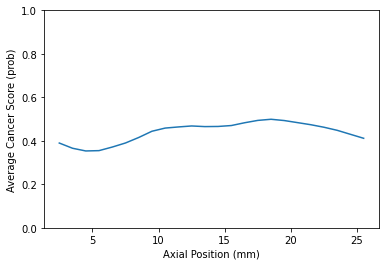

In [31]:
# Average cancer score by axial depth
test = predictions_dataframe.groupby(['position_axial'])['cancer_score'].mean().reset_index().sort_values('position_axial', ascending=True)

plt.plot(test['position_axial'], test['cancer_score'], )
plt.xlabel
plt.xlabel('Axial Position (mm)')
plt.ylabel('Average Cancer Score (prob)')
plt.gca().set_ylim([0, 1])

(0.0, 1.0)

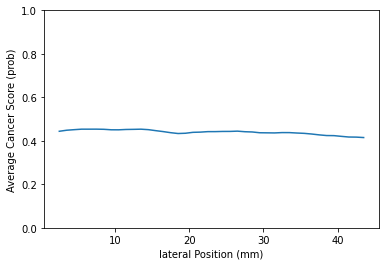

In [32]:
# Average cancer score by lateral position
test = predictions_dataframe.groupby(['position_lateral'])['cancer_score'].mean().reset_index().sort_values('position_lateral', ascending=True)

plt.plot(test['position_lateral'], test['cancer_score'])
plt.xlabel
plt.xlabel('lateral Position (mm)')
plt.ylabel('Average Cancer Score (prob)')
plt.gca().set_ylim([0, 1])

In [33]:
## do it for every anatomical location 
#for anatomical_location in predictions_dataframe['anatomical_location'].unique():
#    sub_df = predictions_dataframe[predictions_dataframe['anatomical_location'] == anatomical_location]
#    test = sub_df.groupby(['position_axial', 'position_lateral'])['prostate_overlap'].mean().reset_index().sort_values('prostate_overlap', ascending=False)
#    correct = sub_df.groupby(['position_axial', 'position_lateral'])['correct'].mean().reset_index().sort_values('correct', ascending=False)
#    test = test.merge(correct, on=['position_axial', 'position_lateral'])
#
#    plt.figure()
#    plt.scatter(test['position_lateral'], test['position_axial'], c=test['prostate_overlap'], s=100, cmap='viridis',)
#    plt.gca().invert_yaxis()
#    plt.xlabel('Lateral Position')
#    plt.ylabel('Axial Position')
#    plt.title('Average prostate overlap by position for {}'.format(anatomical_location))
#    plt.colorbar()
#
#    plt.figure()
#    plt.scatter(test['position_lateral'], test['position_axial'], c=test['correct'], s=50, cmap='viridis',)
#    plt.gca().invert_yaxis()
#    plt.xlabel('Lateral Position')
#    plt.ylabel('Axial Position')
#    plt.title('Average accuracy (predicted patch label matches needle label) by position')
#    plt.colorbar()
#
#

In [34]:
# mean accuracy for each position 
inside_needle_and_prostate.groupby(['position_axial', 'position_lateral'])['correct'].mean().reset_index().sort_values('correct', ascending=False)

# count of each position
counts = []
for (pos_axial, pos_lateral), row in inside_needle_and_prostate.groupby(['position_axial', 'position_lateral']):
    counts.append(
        {
            'position_axial': pos_axial,
            'position_lateral': pos_lateral,
            'count': len(row)
        }
    )

counts = pd.DataFrame(counts)
counts

,position_axial,position_lateral,count
0,5.5,38.5,2
1,5.5,39.5,2
2,5.5,40.5,1
3,5.5,41.5,1
4,5.5,42.5,1
...,...,...,...
153,19.5,21.5,2
154,19.5,22.5,3
155,19.5,23.5,3
156,19.5,24.5,4


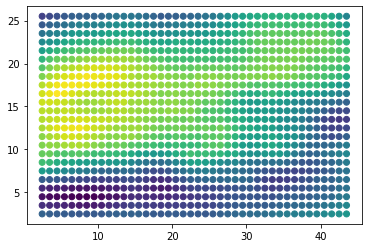

In [35]:
# Do the same thing for inside prostate but not needle

test = predictions_dataframe.groupby(['position_axial', 'position_lateral'])['cancer_score'].mean().reset_index().sort_values('cancer_score', ascending=False)

fig, ax = plt.subplots(1, 1)
ax.scatter(test['position_lateral'], test['position_axial'], c=test['cancer_score'], cmap='viridis')


In [36]:
predictions_dataframe = predictions_dataframe.sort_values('cancer_score', ascending=False)

## Visualization of Patches with Highest Probability of Cancer Vs. Benign

/tmp/ipykernel_30964/516211265.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 2, figsize=(10, 5))


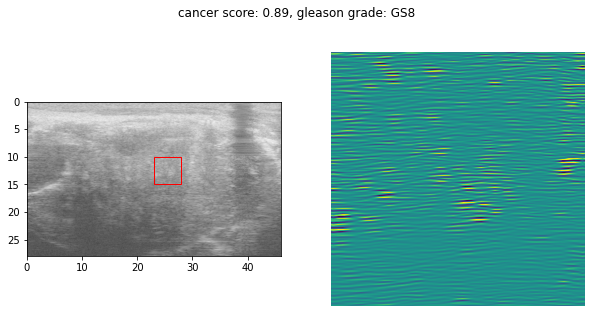

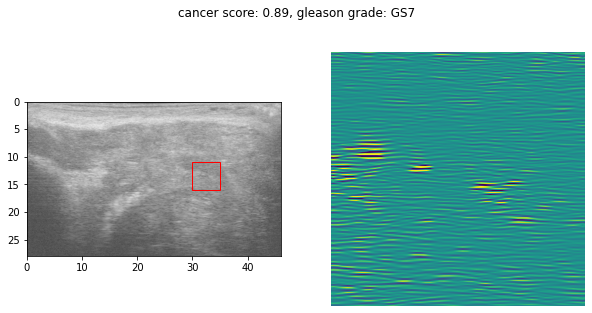

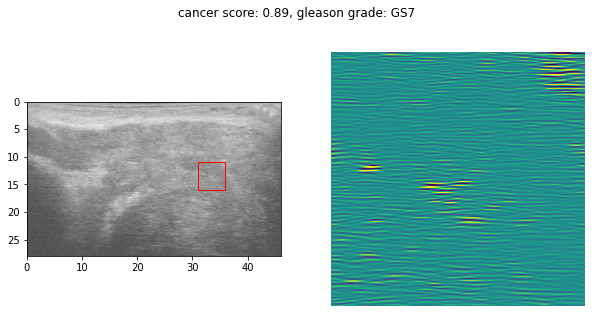

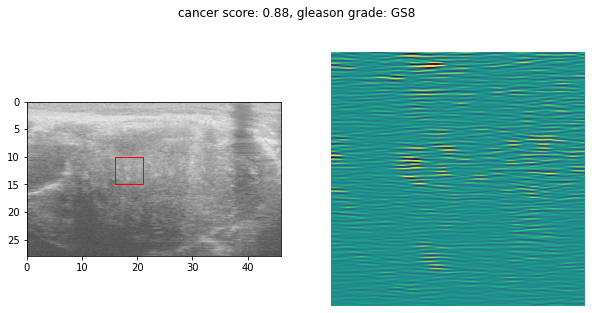

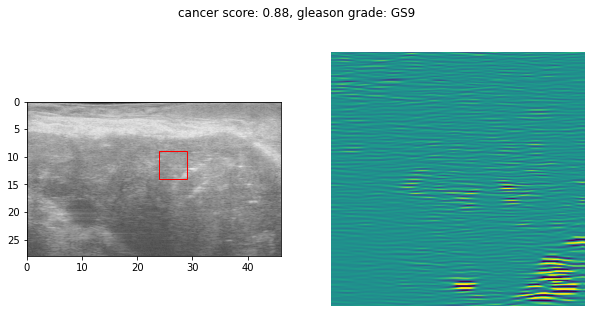

...

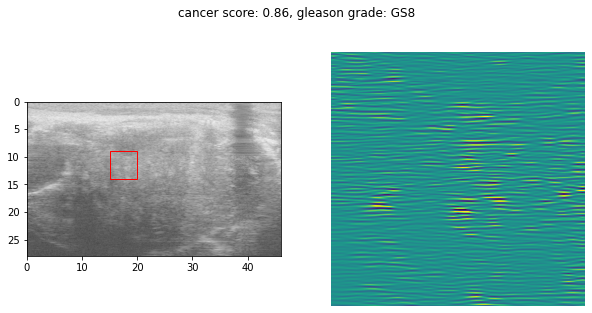

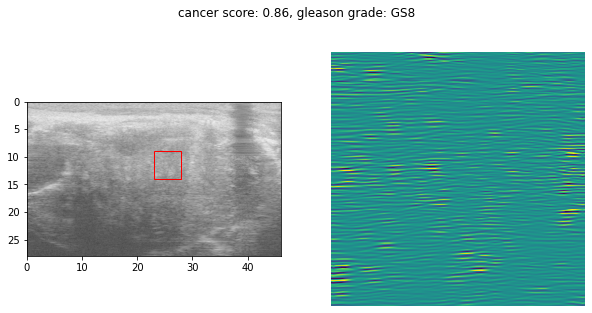

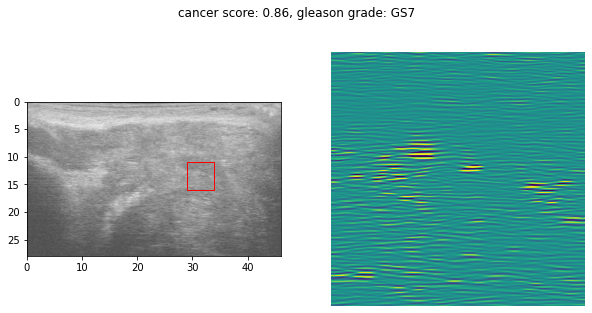

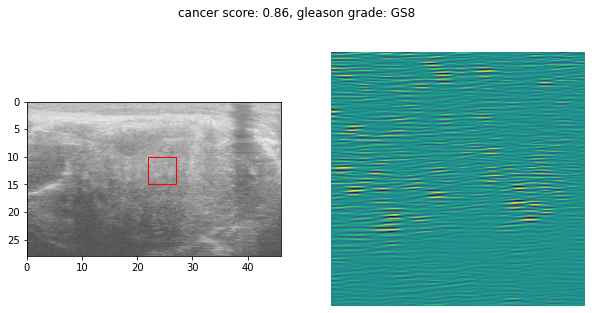

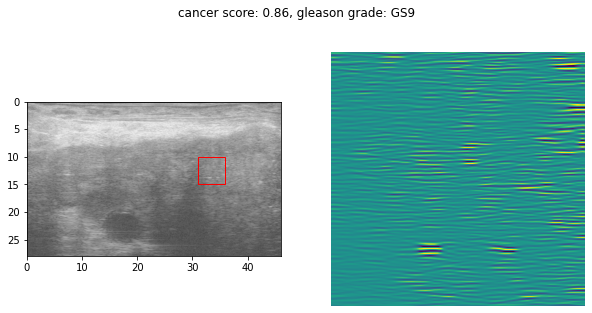

In [37]:

def plot_patch_on_bmode_and_rf(prediction_dataframe, column):
    idx = column
    from matplotlib import patches

    patch_of_interest = prediction_dataframe['top_height_left_width'].iloc[idx]
    x1, x2, y1, y2 = patch_of_interest

    from src.data.exact.core import Core
    core = Core.create_core(prediction_dataframe['core_specifier'].iloc[idx])
    from skimage.transform import resize
    rf_patch = core.get_grid_view()[x1:x2, y1:y2]
    from src.data.exact.transforms import Normalize
    n = Normalize()
    rf_patch = resize(rf_patch, (256, 256))
    rf_patch = torch.tensor(rf_patch).unsqueeze(0)
    rf_patch = n(rf_patch)
    rf_patch = rf_patch.squeeze().numpy()
    bmode = core.bmode 

    
    #print(patch_of_interest)
    #print(f'cancer score', predictions_dataframe['cancer_score'].iloc[idx])
    #print('gleason grade', predictions_dataframe['grade'].iloc[idx])
    
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    ax[0].imshow(bmode, cmap='gray', extent=[0, 46, 28, 0])
    ax[0].add_patch(
        patches.Rectangle(
            (patch_of_interest[2], patch_of_interest[0]),   # (x,y)
            patch_of_interest[3] - patch_of_interest[2],          # width
            patch_of_interest[1] - patch_of_interest[0],          # height
            fc='none', ec='r'
        ),    
    )
   
    
    ax[1].imshow(rf_patch)
    ax[1].axis('off')
    fig.suptitle(
        f'cancer score: {prediction_dataframe["cancer_score"].iloc[idx]:.2f}, gleason grade: {prediction_dataframe["grade"].iloc[idx]}'
    )

    # from scipy.fft import fft2, fftshift
    # rf_patch_fft = fftshift(fft2(rf_patch))
    #rf_patch_fft = np.log(np.abs(rf_patch_fft))
    # only look at main quadrant
    # rf_patch_fft = rf_patch_fft[rf_patch_fft.shape[0]//2:, rf_patch_fft.shape[1]//2:]
    # rf_patch_fft = np.log(np.abs(rf_patch_fft))
    # ax[2].imshow(rf_patch_fft)

predictions_dataframe = predictions_dataframe.sort_values('cancer_score', ascending=False)
for idx in range(25):
    plot_patch_on_bmode_and_rf(predictions_dataframe, idx)

/tmp/ipykernel_30964/516211265.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 2, figsize=(10, 5))


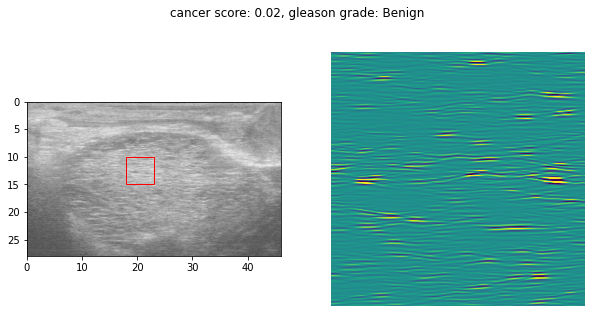

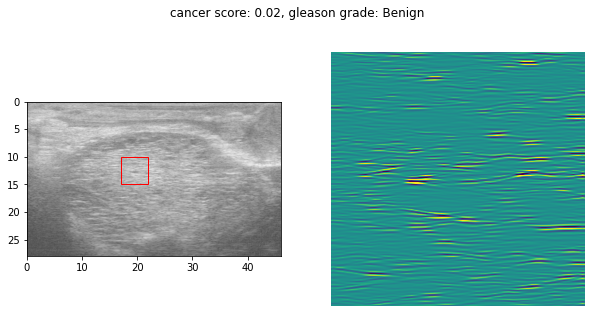

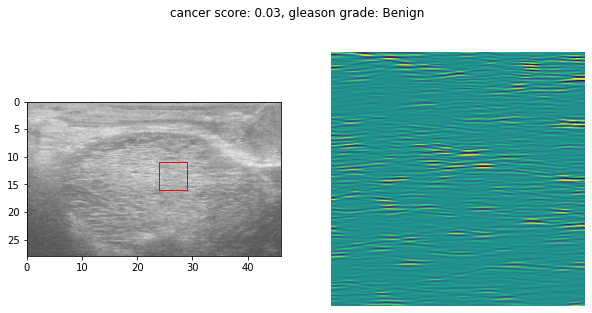

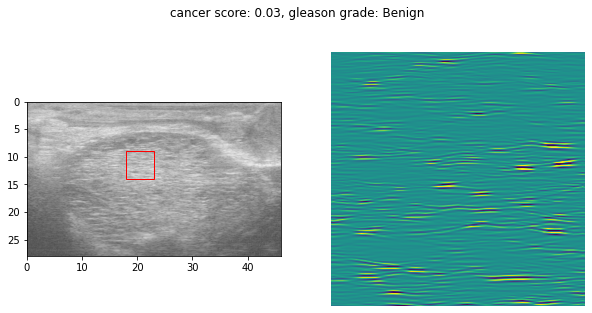

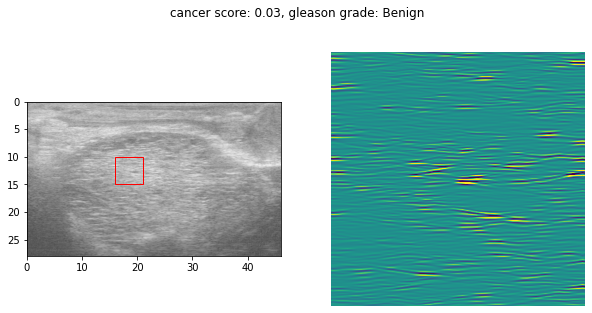

...

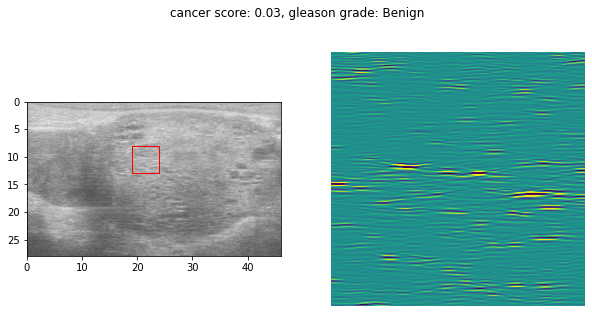

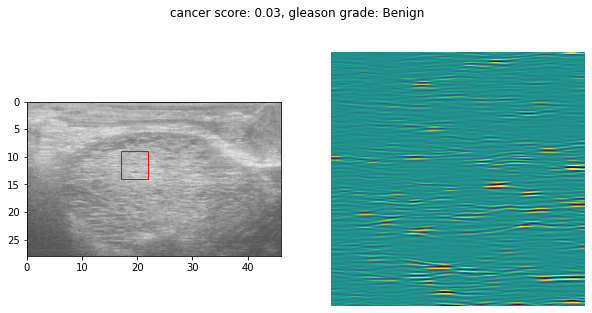

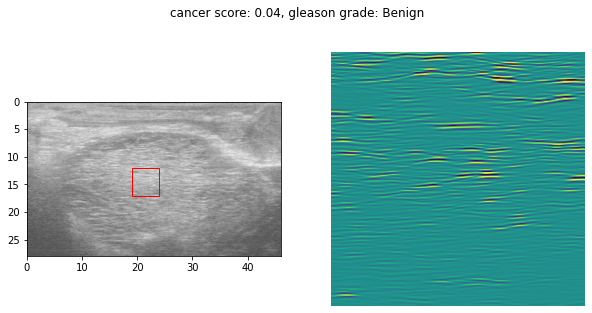

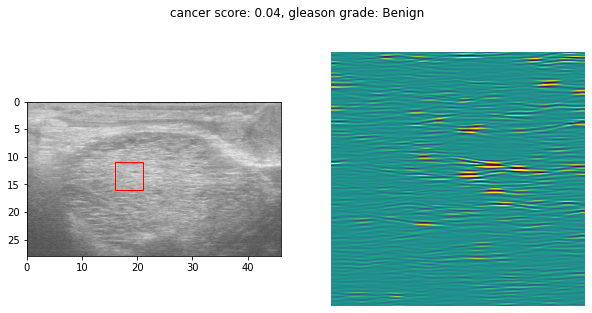

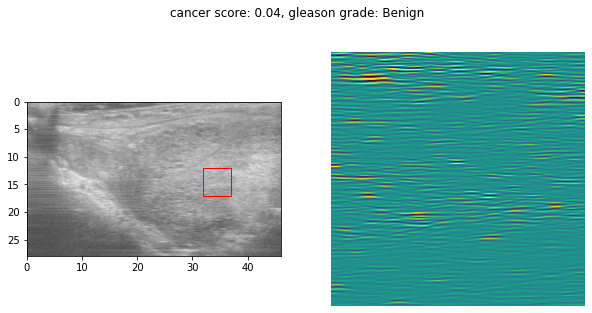

In [38]:
predictions_dataframe = predictions_dataframe.sort_values('cancer_score', ascending=True)

for idx in range(29): 
    plot_patch_on_bmode_and_rf(predictions_dataframe, idx)

  0%|          | 0/10000 [00:00<?, ?it/s]

tensor([-1.0535], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([0.2816], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([1.3824], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([3.7038], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([6.1168], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([8.2858], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([10.2940], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([12.2176], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([14.0684], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([15.8726], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([17.6439], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([19.3804], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([21.0944], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([22.7914], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([24.4771], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([26.1550], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([27.82

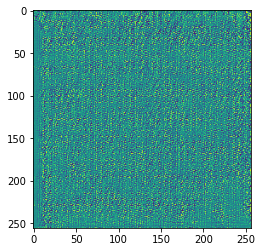

In [39]:
import torchvision
X = torch.nn.Parameter(torch.rand(1, 1, 256, 256).to('cuda:1'))
from tqdm.auto import tqdm
opt = torch.optim.Adam([X], lr=1e-3)
for i in tqdm(range(10000)):
    logits = vicreg.linear_layer(vicreg.backbone(X))
    cancer = logits[:, 1]
    (-cancer).backward()
    opt.step()
    opt.zero_grad()
    if i % 100 == 0:
        print(cancer)
    X.data = torchvision.transforms.functional.gaussian_blur(X.data, 1).detach()

plt.imshow(X.detach().cpu().numpy()[0, 0])

  0%|          | 0/2000 [00:00<?, ?it/s]

tensor([1.0345], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([20.3237], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([36.6543], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([53.6256], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([70.9889], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([88.6415], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([106.4691], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([124.4176], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([142.4787], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([160.6173], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([178.8457], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([197.1447], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([215.5147], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([233.9314], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([252.3949], device='cuda:1', grad_fn=<SelectBackward0>)
tensor([270.9148], device='cuda:1', grad_fn=<SelectBackward0>)

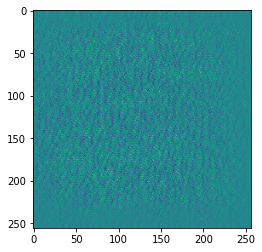

In [40]:
X = torch.nn.Parameter(torch.rand(1, 1, 256, 256).to('cuda:1'))
from tqdm.auto import tqdm
opt = torch.optim.SGD([X], lr=1e1)
for i in tqdm(range(2000)):
    logits = vicreg.linear_layer(vicreg.backbone(X))
    benign = logits[:, 0]
    (-benign).backward()
    opt.step()
    opt.zero_grad()
    if i % 100 == 0:
        print(benign)

plt.imshow(X.detach().cpu().numpy()[0, 0])

## Try using GradCAM

In [41]:
from torchvision.models import resnet152
from torchvision import transforms as T 

resnet = resnet152(pretrained=True)

transform = T.Compose(
    [
    T.Resize(256),
    T.CenterCrop(224),
    T.PILToTensor(),
    T.ConvertImageDtype(torch.float32),]
)

import PIL 
from PIL import Image
import requests
from io import BytesIO
import urllib.request
# importing modules
import urllib.request
from PIL import Image
  
urllib.request.urlretrieve(
  r'https://i.natgeofe.com/n/5d39be8b-c79c-4781-89a6-4f4c7d447fd5/tiger-shark_thumb.jpg',
   "gfg.jpg")
  
img = Image.open("gfg.jpg")
img = transform(img)

/home/paulw/anaconda3/envs/exact/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/paulw/anaconda3/envs/exact/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [42]:
layer3_output = None 
resnet.layer3.register_forward_hook(lambda m, i, o: print(o.shape))
def hook(module, input, output):
    global layer3_output
    layer3_output = output
resnet.layer3.register_forward_hook(hook)
def hook(module, input, output):
    global layer4_output
    layer4_output = output
resnet.layer4.register_forward_hook(hook)

resnet.eval()
out = resnet(img.unsqueeze(0))
layer4_output.retain_grad()
i = torch.argmax(out, -1)
class_score = out[0, i]
class_score.backward()

grad = layer4_output.grad.mean((-1, -2))


torch.Size([1, 1024, 14, 14])


In [43]:
act = torch.zeros((1, 7, 7))

for i in range(2048): 
    act += (layer4_output[0, i, ...] / grad[0, i])

In [44]:
act/= act.max()

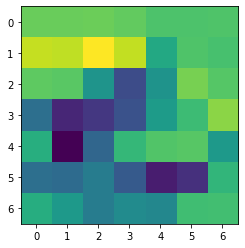

In [45]:
plt.imshow(act.detach().cpu().numpy()[0])

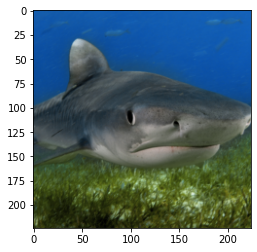

In [46]:
plt.imshow(img.detach().cpu().numpy().transpose(1, 2, 0))

Not sure if grad cam is working, but let's try applying it to see what we get:

Text(0.5, 1.0, 'cancer score: 0.02, gleason grade: Benign')

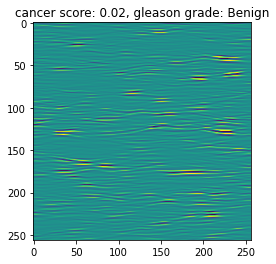

In [47]:
idx = 0

patch_of_interest = predictions_dataframe['top_height_left_width'].iloc[idx]
x1, x2, y1, y2 = patch_of_interest

from src.data.exact.core import Core
core = Core.create_core(predictions_dataframe['core_specifier'].iloc[idx])
from skimage.transform import resize
rf_patch = core.get_grid_view()[x1:x2, y1:y2]
from src.data.exact.transforms import Normalize
n = Normalize()
rf_patch = resize(rf_patch, (256, 256))
rf_patch = torch.tensor(rf_patch).unsqueeze(0)
rf_patch = n(rf_patch).unsqueeze(0)
bmode = core.bmode 
plt.imshow(rf_patch.detach().cpu().numpy()[0, 0])
cancer_score = predictions_dataframe['cancer_score'].iloc[idx]
grade = predictions_dataframe['grade'].iloc[idx]
plt.title(f'cancer score: {cancer_score:.2f}, gleason grade: {grade}')


In [48]:
our_resnet = vicreg.backbone 

In [49]:
class GrabOutputHook: 
    def __init__(self): 
        self.output = None
    def __call__(self, module, input, output):
        self.output = output
        self.output.retain_grad()

output_grabber = GrabOutputHook()
our_resnet.layer3.register_forward_hook(output_grabber)

In [50]:
our_resnet.eval()
rf_patch = rf_patch.float()
out = vicreg.backbone(rf_patch.to('cuda:1'))
out = vicreg.linear_layer(out)
benign_score = out[0, 0]
prob = out.softmax(-1)[0, 1]

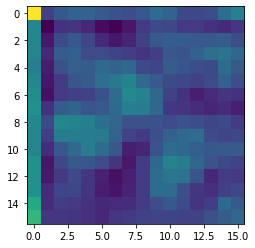

In [51]:
plt.imshow(output_grabber.output.mean(1).detach().cpu().numpy()[0])

In [52]:
benign_score.backward()

act = output_grabber.output
heatmap = torch.zeros((act.shape[0], act.shape[2], act.shape[3])).to('cuda:1')
grad = output_grabber.output.grad.mean((-1, -2))
for i in range(act.shape[1]): 
    heatmap += (act[0, i, ...] / grad[0, i])

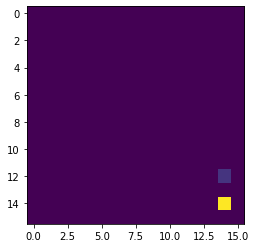

In [53]:
plt.imshow(output_grabber.output.grad.mean(1).relu().detach().cpu().numpy()[0])

In [54]:
our_resnet.conv1.weight.shape

torch.Size([64, 1, 7, 7])

Text(0.5, 0.98, 'First layer convolution kernels')

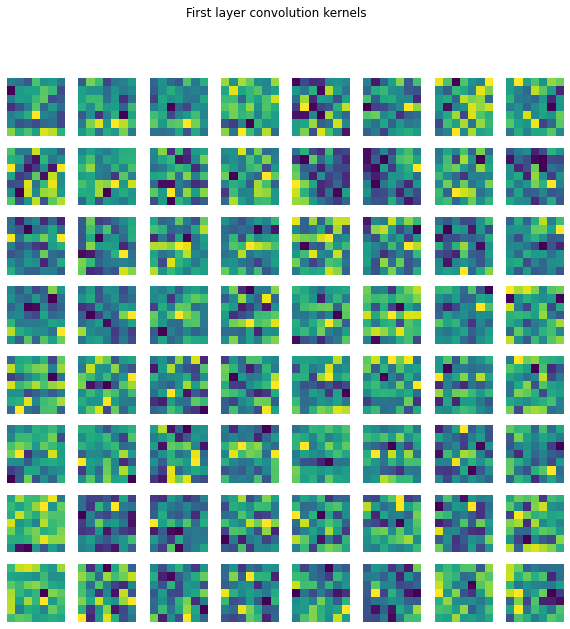

In [55]:
fig, ax = plt.subplots(8, 8, figsize=(10, 10))
ax = ax.flatten()

for i in range(64): 
    ax[i].imshow(our_resnet.conv1.weight[i, ...].detach().cpu().numpy()[0])
    ax[i].axis('off')

fig.suptitle('First layer convolution kernels')

Text(0.5, 0.98, 'First layer convolution kernels from imagenet resnet')

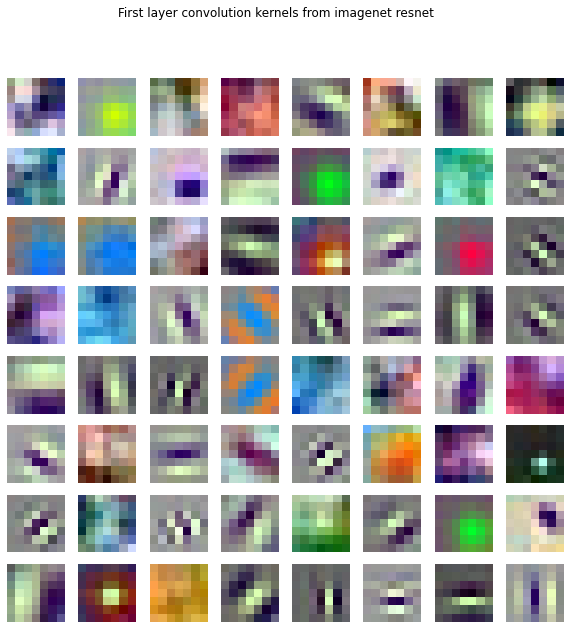

In [56]:
# Do the same thing for resnet 
fig, ax = plt.subplots(8, 8, figsize=(10, 10))
ax = ax.flatten()

for i in range(64): 
    kernel = resnet.conv1.weight[i, ...].detach().cpu().numpy()
    kernel = kernel - kernel.min()
    kernel = kernel / kernel.max()
    kernel = kernel.transpose(1, 2, 0)
    ax[i].imshow(kernel)
    ax[i].axis('off')

fig.suptitle('First layer convolution kernels from imagenet resnet')

Trying guided backprop


In [74]:
from torch.nn import ReLU
from torch import nn
from torch.nn import functional as F

class MyModel(torch.nn.Module): 
    def __init__(self): 
        import copy
        super().__init__()
        self.backbone = vicreg.backbone
        self.linear_layer = vicreg.linear_layer
    def forward(self, X): 
        return self.linear_layer(self.backbone(X))

model = MyModel()
model.cpu()

def backward_hook(module, grad_in, grad_out):
    # Cut off negative gradients
    if isinstance(module, nn.ReLU):
        return (F.relu(grad_in[0]),)

model.apply(lambda module: module.register_backward_hook(backward_hook))

MyModel(
  (backbone): ResNet(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (layer2): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, m

/home/paulw/anaconda3/envs/exact/lib/python3.9/site-packages/torch/nn/modules/module.py:1053: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


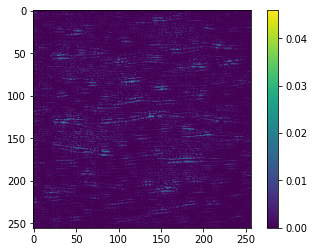

In [93]:
opt = torch.optim.Adam(model.parameters(), lr=0.01) 
opt.zero_grad()
in_patch = rf_patch.cpu()
in_patch.requires_grad = True

out = model(in_patch)
benign_score = out[0, 0]
benign_score.backward()

benign_grad = in_patch.grad.detach().cpu().numpy()[0][0]
plt.imshow(torch.log(in_patch.grad.detach().relu() + 1).cpu().numpy()[0][0])
plt.colorbar()

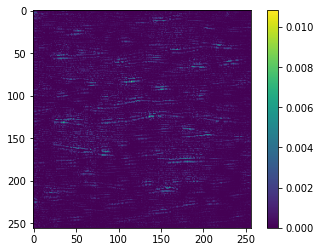

In [94]:
opt = torch.optim.Adam(model.parameters(), lr=0.01) 
opt.zero_grad()
in_patch = rf_patch.cpu()
in_patch.grad = None
in_patch.requires_grad = True

out = model(in_patch)
benign_score = out[0, 1]
benign_score.backward()

cancer_grad = in_patch.grad.detach().cpu().numpy()[0][0]
plt.imshow(torch.log(in_patch.grad.detach().relu() + 1).cpu().numpy()[0][0])
plt.colorbar()

In [ ]:

in_patch = rf_patch.cpu()
in_patch.requires_grad = True
our_resnet.eval()

out = model(in_patch)
benign_score = out[0, 0]
benign_score.backward()

plt.imshow(torch.log(in_patch.grad.detach().relu() + 1).cpu().numpy()[0][0])
plt.colorbar()

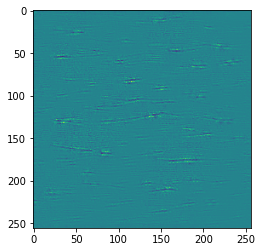

In [95]:
diff = benign_grad - cancer_grad
plt.imshow(diff)

## Analyzing TGC settings


In [59]:
import pandas as pd 
df = pd.read_csv('../data/imaging_parameters.csv', index_col=0)

In [60]:
# Only keep columns with many unique values
columns_with_many_unique_values = []
for column in df.columns: 
    if len(df[column].unique()) > 2: 
        columns_with_many_unique_values.append(column)

df = df[columns_with_many_unique_values]

In [61]:
tgc = df['Global.Tgc/Control']
# Look at the TGC values

import numpy as np

def decode(encoded_str):
    out = encoded_str.replace('\'', '').removeprefix('[').removesuffix(']').split(',')
    out = [float(x) for x in out]
    return out

core_specifiers = df['core_specifier']
tgcs = np.stack(list(tgc.apply(decode)))

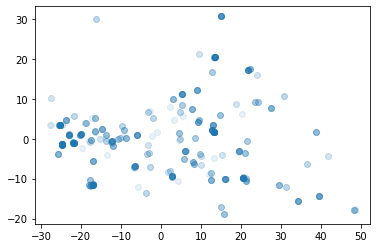

In [62]:
# project the tgcs onto the first two principal components - this is for the whole dataset

from sklearn.decomposition import PCA
pca = PCA(n_components=2)

tgcs_projected = pca.fit_transform(tgcs)

# Plot the tgcs projected onto the first two principal components

plt.scatter(tgcs_projected[:, 0], tgcs_projected[:, 1], alpha=0.1)

/tmp/ipykernel_30964/2654226531.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  inside_needle_and_prostate = predictions_dataframe[predictions_dataframe['prostate_overlap'] >= .99][predictions_dataframe['needle_overlap'] >= .66]


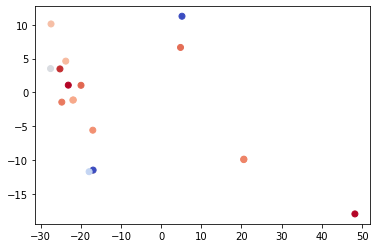

In [63]:
inside_needle_and_prostate = predictions_dataframe[predictions_dataframe['prostate_overlap'] >= .99][predictions_dataframe['needle_overlap'] >= .66]
inside_needle_and_prostate = inside_needle_and_prostate.join(df.set_index('core_specifier')[['Global.Tgc/Control']], on='core_specifier', how='left')
correct_classifications = inside_needle_and_prostate.groupby('Global.Tgc/Control').correct.mean()

tgcs = correct_classifications.reset_index()['Global.Tgc/Control'].apply(decode)
tgcs = np.stack(tgcs)
proj = pca.transform(tgcs)

plt.scatter(
    proj[:, 0],
    proj[:, 1],
    c=correct_classifications.values,
    cmap='coolwarm',
)

In [64]:
correct_classifications

Global.Tgc/Control
['-0.588235294117649', '1.29411764705882', '2.23529411764706', '4.58823529411765', '5.29411764705883', '4.11764705882353', '1.05882352941176', '-3.17647058823529']     0.656250
['-0.588235294117649', '3.64705882352941', '14.2352941176471', '19.1764705882353', '19.1764705882353', '18', '6.94117647058823', '7.64705882352941']                    0.843750
['-0.823529411764707', '1.29411764705882', '10', '2.47058823529412', '4.8235294117647', '3.88235294117647', '4.11764705882353', '1.52941176470588']                     0.862500
['-10', '3.88235294117647', '14.2352941176471', '19.1764705882353', '23.8823529411765', '18', '6.94117647058823', '7.41176470588236']                                   0.000000
['-4.11764705882353', '-0.352941176470587', '1.05882352941176', '1.52941176470588', '4.35294117647059', '2', '1.29411764705882', '-2.23529411764706']                   0.484375
['-4.11764705882353', '-0.352941176470587', '1.29411764705882', '1.52941176470588', '4.352941176

In [65]:
inside_needle_and_prostate

,cancer_score,core_specifier,patient_specifier,grade,ce_loss,needle_overlap,prostate_overlap,age,center,psa,position_axial,position_lateral,correct,anatomical_location,top_height_left_width,all_cores_benign,Global.Tgc/Control
24202,0.051425,UVA-0145_RML,UVA-0145,Benign,0.052795,0.710562,1.0,62,UVA,12.69,9.5,39.5,True,RML,"[7, 12, 37, 42]",True,"['-0.588235294117649', '3.64705882352941', '14..."
14151,0.064878,UVA-0216_RBL,UVA-0216,Benign,0.067078,0.687681,1.0,62,UVA,7.79,13.5,28.5,True,RBL,"[11, 16, 26, 31]",True,"['-0.823529411764707', '1.29411764705882', '10..."
19175,0.065330,UVA-0180_LBL,UVA-0180,Benign,0.067561,0.710562,1.0,65,UVA,4.30,12.5,30.5,True,LBL,"[10, 15, 28, 33]",True,"['0.352941176470587', '2.70588235294117', '2.2..."
14179,0.066651,UVA-0216_RBL,UVA-0216,Benign,0.068976,0.687681,1.0,62,UVA,7.79,15.5,28.5,True,RBL,"[13, 18, 26, 31]",True,"['-0.823529411764707', '1.29411764705882', '10..."
14137,0.066671,UVA-0216_RBL,UVA-0216,Benign,0.068997,0.712727,1.0,62,UVA,7.79,12.5,28.5,True,RBL,"[10, 15, 26, 31]",True,"['-0.823529411764707', '1.29411764705882', '10..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57513,0.827648,UVA-0211_RAM,UVA-0211,GS7,0.189167,0.710562,1.0,77,UVA,16.60,12.5,37.5,True,RAM,"[10, 15, 35, 40]",False,"['-4.11764705882353', '-0.352941176470587', '1..."
55470,0.834081,UVA-0163_LML,UVA-0163,GS7,0.181425,0.709908,1.0,67,UVA,4.50,10.5,33.5,True,LML,"[8, 13, 31, 36]",False,"['0.352941176470587', '2.94117647058823', '2.4..."
57498,0.834270,UVA-0211_RAM,UVA-0211,GS7,0.181199,0.710562,1.0,77,UVA,16.60,11.5,36.5,True,RAM,"[9, 14, 34, 39]",False,"['-4.11764705882353', '-0.352941176470587', '1..."
57497,0.834693,UVA-0211_RAM,UVA-0211,GS7,0.180691,0.710562,1.0,77,UVA,16.60,11.5,35.5,True,RAM,"[9, 14, 33, 38]",False,"['-4.11764705882353', '-0.352941176470587', '1..."


In [66]:
correct_classifications

Global.Tgc/Control
['-0.588235294117649', '1.29411764705882', '2.23529411764706', '4.58823529411765', '5.29411764705883', '4.11764705882353', '1.05882352941176', '-3.17647058823529']     0.656250
['-0.588235294117649', '3.64705882352941', '14.2352941176471', '19.1764705882353', '19.1764705882353', '18', '6.94117647058823', '7.64705882352941']                    0.843750
['-0.823529411764707', '1.29411764705882', '10', '2.47058823529412', '4.8235294117647', '3.88235294117647', '4.11764705882353', '1.52941176470588']                     0.862500
['-10', '3.88235294117647', '14.2352941176471', '19.1764705882353', '23.8823529411765', '18', '6.94117647058823', '7.41176470588236']                                   0.000000
['-4.11764705882353', '-0.352941176470587', '1.05882352941176', '1.52941176470588', '4.35294117647059', '2', '1.29411764705882', '-2.23529411764706']                   0.484375
['-4.11764705882353', '-0.352941176470587', '1.29411764705882', '1.52941176470588', '4.352941176

In [67]:

inside_needle_and_prostate = predictions_dataframe[predictions_dataframe['needle_overlap'] >= 0.66][predictions_dataframe['prostate_overlap'] >= 1]


/tmp/ipykernel_30964/3831791218.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  inside_needle_and_prostate = predictions_dataframe[predictions_dataframe['needle_overlap'] >= 0.66][predictions_dataframe['prostate_overlap'] >= 1]


In [68]:
average_accuracy = pd.DataFrame(average_accuracy).reset_index()

NameError: name 'average_accuracy' is not defined

In [ ]:
df = average_accuracy.join(df.set_index('core_specifier'), on='core_specifier')

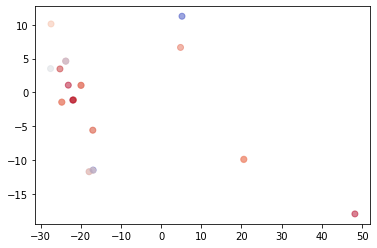

In [ ]:
tcg = df['Global.Tgc/Control']

tcg = np.stack(list(tcg.apply(decode)))
proj = pca.transform(tcg)

plt.scatter(proj[:, 0], proj[:, 1], c=df['correct'], cmap='coolwarm', alpha=0.5)

Conclusion: No relation between TGC values and predictions.

## Rule out tissue level 